In [1]:
# import libraries / tools
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from matplotlib import pyplot as plt
from plotly.subplots import make_subplots
from sklearn.ensemble import GradientBoostingRegressor
import hvplot.pandas

In [2]:
# load data file 
df = pd.read_csv('Data/FIFA_players_21_1_dataset.csv')
# see max columns
pd.set_option('display.max_columns', None)
# dataframe describe
df.head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,league_name,league_rank,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,33,1987-06-24,170,72,Argentina,FC Barcelona,Spain Primera Division,1.0,93,93,67500000,560000,"RW, ST, CF",Left,5,4,4,Medium/Low,Messi,Yes,138400000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...",CAM,10.0,NaN,2004-07-01,2021.0,RW,10.0,85.0,92.0,91.0,95.0,38.0,65.0,NaN,NaN,NaN,NaN,NaN,NaN,"Finesse Shot, Long Shot Taker (AI), Speed Drib...",85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,NaN,35,24,6,11,15,14,8,89+3,89+3,89+3,92+0,93+0,93+0,93+0,92+0,93+0,93+0,93+0,91+2,87+3,87+3,87+3,91+2,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,1985-02-05,187,83,Portugal,Juventus,Italian Serie A,1.0,92,92,46000000,220000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,75900000.0,"#Aerial Threat, #Dribbler, #Distance Shooter, ...",LS,7.0,NaN,2018-07-10,2022.0,LS,7.0,89.0,93.0,81.0,89.0,35.0,77.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Flair, Long Shot Taker (AI), ...",84,95,90,82,86,88,81,76,77,92,87,91,87,95,71,94,95,84,78,93,63,29,95,82,84,95,NaN,32,24,7,11,15,14,11,91+1,91+1,91+1,89+0,91+0,91+0,91+0,89+0,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3
2,200389,https://sofifa.com/player/200389/jan-oblak/210002,J. Oblak,Jan Oblak,27,1993-01-07,188,87,Slovenia,Atlético Madrid,Spain Primera Division,1.0,91,93,75000000,125000,GK,Right,3,3,1,Medium/Medium,PLAYER_BODY_TYPE_259,Yes,159400000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,90.0,52.0,90.0,"GK Long Throw, Comes For Crosses",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,NaN,12,18,87,92,78,90,90,33+3,33+3,33+3,32+0,35+0,35+0,35+0,32+0,38+3,38+3,38+3,35+3,38+3,38+3,38+3,35+3,32+3,36+3,36+3,36+3,32+3,32+3,33+3,33+3,33+3,32+3
3,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,31,1988-08-21,184,80,Poland,FC Bayern München,German 1. Bundesliga,1.0,91,91,80000000,240000,ST,Right,4,4,4,High/Medium,PLAYER_BODY_TYPE_276,Yes,132000000.0,"#Distance Shooter, #Clinical Finisher",ST,9.0,NaN,2014-07-01,2023.0,NaN,NaN,78.0,91.0,78.0,85.0,43.0,82.0,NaN,NaN,NaN,NaN,NaN,NaN,"Solid Player, Finesse Shot, Outside Foot Shot,...",71,94,85,84,89,85,79,85,70,88,77,78,77,93,82,89,84,76,86,85,81,49,94,79,88,88,NaN,42,19,15,6,12,8,10,89+2,89+2,89+2,85+0,87+0,87+0,87+0,85+0,85+3,85+3,85+3,83+3,79+3,79+3,79+3,83+3,64+3,65+3,65+3,65+3,64+3,61+3,60+3,60+3,60+3,61+3
4,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos 

In [3]:
# dataframe all info
df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18944 entries, 0 to 18943
Data columns (total 106 columns):
 #    Column                      Non-Null Count  Dtype  
---   ------                      --------------  -----  
 0    sofifa_id                   18944 non-null  int64  
 1    player_url                  18944 non-null  object 
 2    short_name                  18944 non-null  object 
 3    long_name                   18944 non-null  object 
 4    age                         18944 non-null  int64  
 5    dob                         18944 non-null  object 
 6    height_cm                   18944 non-null  int64  
 7    weight_kg                   18944 non-null  int64  
 8    nationality                 18944 non-null  object 
 9    club_name                   18719 non-null  object 
 10   league_name                 18719 non-null  object 
 11   league_rank                 18719 non-null  float64
 12   overall                     18944 non-null  int64  
 13   potential     

<ipython-input-3-cd8a3b628bb4>:2: FutureWarning: null_counts is deprecated. Use show_counts instead
  df.info(verbose=True, null_counts=True)


In [4]:
df.describe()

,sofifa_id,age,height_cm,weight_kg,league_rank,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18944.000000,18944.000000,18944.000000,18944.000000,18719.000000,18944.000000,18944.000000,1.894400e+04,18944.000000,18944.000000,18944.000000,18944.000000,1.794900e+04,18719.000000,18719.000000,1127.000000,16861.000000,16861.000000,16861.000000,16861.000000,16861.000000,16861.000000,2083.000000,2083.000000,2083.000000,2083.000000,2083.000000,2083.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,0.0,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000
mean,226242.402872,25.225823,181.190773,75.016892,1.357070,65.677787,71.086729,2.224813e+06,8675.852513,1.091850,2.936603,2.363017,4.296353e+06,20.589668,2021.983332,12.029281,67.668110,52.274954,57.139434,62.455430,51.316292,64.458988,65.164186,62.889102,61.719635,66.108017,37.203553,63.171867,49.612859,45.796083,51.874578,58.705448,42.669552,55.546400,47.187289,42.356155,52.653030,58.482791,64.285103,64.326489,63.333193,61.609428,63.918549,57.752798,64.590530,62.596020,64.742927,46.758763,55.488862,46.250000,50.255807,53.828231,48.050412,57.978674,NaN,47.581767,45.546505,16.446052,16.236486,16.103357,16.225982,16.551309
std,27171.091056,4.697354,6.825672,7.057140,0.739327,7.002278,6.109985,5.102486e+06,19654.774894,0.361841,0.667132,0.766469,1.005968e+07,17.057568,1.260426,6.674627,10.984862,13.991421,10.273655,10.048706,16.405179,9.746706,7.710474,7.328945,7.575184,8.126601,10.714523,8.565969,18.153057,19.592269,17.321709,14.572383,17.661569,18.787112,18.231204,17.239561,15.205281,16.598040,14.926452,14.689422,14.625189,9.112954,14.075215,13.330631,11.888479,15.878793,12.519775,19.305319,17.203045,20.738106,19.443738,13.724072,15.671721,12.118390,NaN,21.402461,20.953997,17.577332,16.845480,16.519399,17.017341,17.878121
min,41.000000,16.000000,155.000000,50.000000,1.000000,47.000000,47.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,9.000000e+03,1.000000,2020.000000,1.000000,25.000000,16.000000,25.000000,25.000000,15.000000,28.000000,45.000000,43.000000,35.000000,44.000000,12.000000,38.000000,6.000000,3.000000,5.000000,7.000000,3.000000,5.000000,4.000000,5.000000,5.000000,5.000000,13.000000,12.000000,14.000000,24.000000,12.000000,18.000000,15.000000,12.000000,16.000000,4.000000,9.000000,3.000000,2.000000,9.000000,6.000000,12.000000,NaN,5.000000,4.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,210030.500000,21.000000,176.000000,70.000000,1.000000,61.000000,67.000000,3.000000e+05,1000.000000,1.000000,3.000000,2.000000,5.250000e+05,9.000000,2021.000000,6.000000,62.000000,42.000000,50.000000,57.000000,36.000000,58.000000,60.000000,58.000000,57.000000,60.000000,28.000000,57.000000,38.000000,30.000000,44.000000,54.000000,30.000000,49.000000,35.000000,31.000000

In [5]:
# check the all null value
pd.set_option('display.max_rows', None)
print(df.isnull().sum())

sofifa_id                         0
player_url                        0
short_name                        0
long_name                         0
age                               0
dob                               0
height_cm                         0
weight_kg                         0
nationality                       0
club_name                       225
league_name                     225
league_rank                     225
overall                           0
potential                         0
value_eur                         0
wage_eur                          0
player_positions                  0
preferred_foot                    0
international_reputation          0
weak_foot                         0
skill_moves                       0
work_rate                         0
body_type                         0
real_face                         0
release_clause_eur              995
player_tags                   17536
team_position                   225
team_jersey_number          

In [6]:
# show the correlation between value_eur and all other features 
df.corr()['value_eur'].sort_values(ascending=False)

value_eur                     1.000000
release_clause_eur            0.993988
wage_eur                      0.840126
overall                       0.630085
potential                     0.571925
international_reputation      0.564192
gk_handling                   0.564107
gk_reflexes                   0.560722
gk_diving                     0.558576
movement_reactions            0.558071
gk_positioning                0.526536
gk_kicking                    0.479000
passing                       0.461792
mentality_composure           0.447076
dribbling                     0.445942
mentality_vision              0.366410
power_shot_power              0.354212
shooting                      0.339697
attacking_short_passing       0.329672
skill_long_passing            0.311820
skill_ball_control            0.300466
skill_moves                   0.293722
skill_curve                   0.290695
attacking_volleys             0.270210
gk_speed                      0.269484
skill_dribbling          

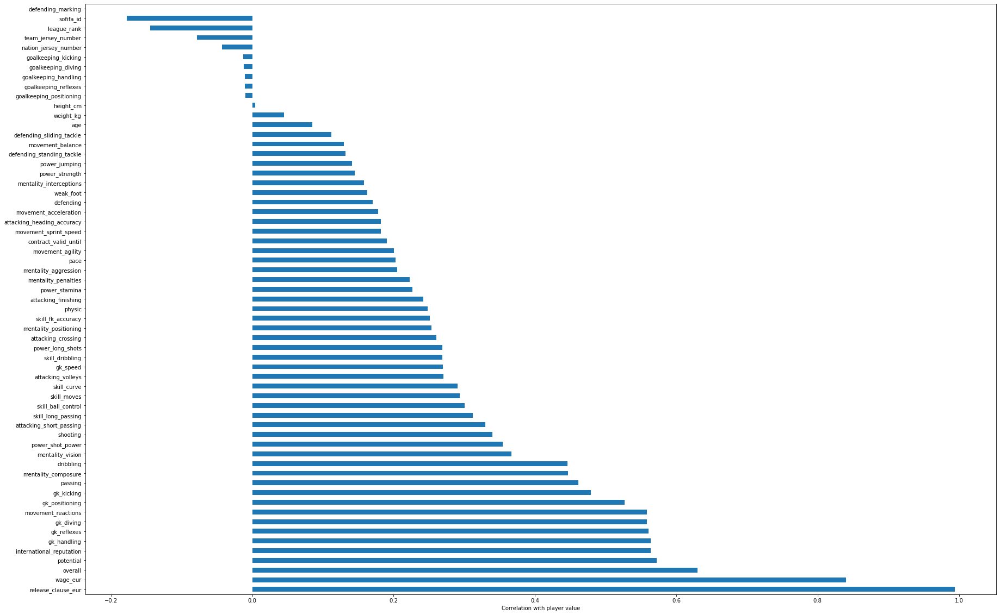

In [7]:
df.corr()['value_eur'].sort_values(ascending=False).iloc[1:].plot(kind='barh',figsize=(30,20))
plt.xlabel("Correlation with player value")
plt.show()

In [8]:
# drop unneeded columnes from the dataset also we dont need Goalkeeper [GK] data, we oly going to focus on Attack, mid, defending players only
df = df.drop(['sofifa_id', 'player_url', 'short_name', 'long_name', 'dob', 'nationality', 'club_name',
              'league_name', 'league_rank', 'work_rate', 'body_type', 'real_face', 'release_clause_eur', 
              'player_tags', 'team_position', 'team_jersey_number', 'loaned_from', 'joined', 'contract_valid_until', 'nation_position', 
              'nation_jersey_number', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 'gk_positioning', 'player_traits', 
              'defending_marking', 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes'], axis=1)
# drop value_eur row with 0 value from the dataset
df = df.loc[df['value_eur']!=0]
# drop all other rows with null value from the dataset
df = df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16654 entries, 0 to 18943
Data columns (total 72 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   age                         16654 non-null  int64  
 1   height_cm                   16654 non-null  int64  
 2   weight_kg                   16654 non-null  int64  
 3   overall                     16654 non-null  int64  
 4   potential                   16654 non-null  int64  
 5   value_eur                   16654 non-null  int64  
 6   wage_eur                    16654 non-null  int64  
 7   player_positions            16654 non-null  object 
 8   preferred_foot              16654 non-null  object 
 9   international_reputation    16654 non-null  int64  
 10  weak_foot                   16654 non-null  int64  
 11  skill_moves                 16654 non-null  int64  
 12  pace                        16654 non-null  float64
 13  shooting                    166

In [9]:
# Create dummies for preferred_foot
player_foot = df['preferred_foot'].str.get_dummies(sep=', ').add_prefix('foot_')
# Replace preferred_foot with the new output dummies
df = pd.concat([df.drop(['preferred_foot'],axis=1), player_foot],axis=1)
# Create dummies for player position
new_player_position = df['player_positions'].str.get_dummies(sep=', ').add_prefix('position_')
# Replace player_positions with the new output dummies
df = pd.concat([df.drop(['player_positions'],axis=1), new_player_position],axis=1)
# Drop goolkeeper form our dataset so we can only fouces on Attack, Mid, Defence positions only
df = df.drop('position_GK', axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16654 entries, 0 to 18943
Data columns (total 86 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   age                         16654 non-null  int64  
 1   height_cm                   16654 non-null  int64  
 2   weight_kg                   16654 non-null  int64  
 3   overall                     16654 non-null  int64  
 4   potential                   16654 non-null  int64  
 5   value_eur                   16654 non-null  int64  
 6   wage_eur                    16654 non-null  int64  
 7   international_reputation    16654 non-null  int64  
 8   weak_foot                   16654 non-null  int64  
 9   skill_moves                 16654 non-null  int64  
 10  pace                        16654 non-null  float64
 11  shooting                    16654 non-null  float64
 12  passing                     16654 non-null  float64
 13  dribbling                   166

In [10]:
df.head(3)

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_standing_tackle,defending_sliding_tackle,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,foot_Left,foot_Right,position_CAM,position_CB,position_CDM,position_CF,position_CM,position_LB,position_LM,position_LW,position_LWB,position_RB,position_RM,position_RW,position_RWB,position_ST
0,33,170,72,93,93,67500000,560000,5,4,4,85.0,92.0,91.0,95.0,38.0,65.0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,35,24,89+3,89+3,89+3,92+0,93+0,93+0,93+0,92+0,93+0,93+0,93+0,91+2,87+3,87+3,87+3,91+2,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1
1,35,187,83,92,92,46000000,220000,5,4,5,89.0,93.0,81.0,89.0,35.0,77.0,84,95,90,82,86,88,81,76,77,92,87,91,87,95,71,94,95,84,78,93,63,29,95,82,84,95,32,24,91+1,91+1,91+1,89+0,91+0,91+0,91+0,89+0,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1
3,31,184,80,91,91,80000000,240000,4,4,4,78.0,91.0,78.0,85.0,43.0,82.0,71,94,85,84,89,85,79,85,70,88,77,78,77,93,82,89,84,76,86,85,81,49,94,79,88,88,42,19,89+2,89+2,89+2,85+0,87+0,87+0,87+0,85+0,85+3,85+3,85+3,83+3,79+3,79+3,79+3,83+3,64+3,65+3,65+3,65+3,64+3,61+3,60+3,60+3,60+3,61+3,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [11]:
# function to split player position power for converting string to int 
def my_function(pos_pow):
    # split ppp by + character and create two values first and last and conver string to int 
    new = pos_pow.str.split('+', n = 1, expand = True)
    df['First_'] = new[0]
    df['First_'] = df['First_'].astype(np.int64)
    df['Last_'] = new[1]
    df['Last_'] = df['Last_'].replace(r'', np.nan, regex=True)
    df['Last_'] = df['Last_'].fillna(0)
    df['Last_'] = df['Last_'].astype(np.int64)
    #sum the values to get player position power
    new_pos_pow = df['First_'] + df['Last_']
    #return sum value of values first + last
    return new_pos_pow;

In [12]:
# use my_function to calculate player position power for all positions 
df['ls'] = my_function(df['ls'])
df['st'] = my_function(df['st'])
df['rs'] = my_function(df['rs'])
df['lw'] = my_function(df['lw'])
df['lf'] = my_function(df['lf'])
df['cf'] = my_function(df['cf'])
df['rf'] = my_function(df['rf'])
df['rw'] = my_function(df['rw'])
df['lam'] = my_function(df['lam'])
df['cam'] = my_function(df['cam'])
df['ram'] = my_function(df['ram'])
df['lm'] = my_function(df['lm'])
df['lcm'] = my_function(df['lcm'])
df['cm'] = my_function(df['cm'])
df['rcm'] = my_function(df['rcm'])
df['rm'] = my_function(df['rm'])
df['lwb'] = my_function(df['lwb'])
df['ldm'] = my_function(df['ldm'])
df['cdm'] = my_function(df['cdm'])
df['rdm'] = my_function(df['rdm'])
df['lb'] = my_function(df['lb'])
df['lcb'] = my_function(df['lcb'])
df['cb'] = my_function(df['cb'])
df['rcb'] = my_function(df['rcb'])
df['rb'] = my_function(df['rb'])
df['rwb'] = my_function(df['rwb'])
#drop First_ and Last_ columns
df = df.drop('First_', axis=1)
df = df.drop('Last_', axis=1)

In [13]:
df.head(7)

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_standing_tackle,defending_sliding_tackle,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,foot_Left,foot_Right,position_CAM,position_CB,position_CDM,position_CF,position_CM,position_LB,position_LM,position_LW,position_LWB,position_RB,position_RM,position_RW,position_RWB,position_ST
0,33,170,72,93,93,67500000,560000,5,4,4,85.0,92.0,91.0,95.0,38.0,65.0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,35,24,92,92,92,92,93,93,93,92,93,93,93,93,90,90,90,93,69,68,68,68,69,65,55,55,55,65,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1
1,35,187,83,92,92,46000000,220000,5,4,5,89.0,93.0,81.0,89.0,35.0,77.0,84,95,90,82,86,88,81,76,77,92,87,91,87,95,71,94,95,84,78,93,63,29,95,82,84,95,32,24,92,92,92,89,91,91,91,89,91,91,91,91,84,84,84,91,68,64,64,64,68,64,57,57,57,64,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1
3,31,184,80,91,91,80000000,240000,4,4,4,78.0,91.0,78.0,85.0,43.0,82.0,71,94,85,84,89,85,79,85,70,88,77,78,77,93,82,89,84,76,86,85,81,49,94,79,88,88,42,19,91,91,91,85,87,87,87,85,88,88,88,86,82,82,82,86,67,68,68,68,67,64,63,63,63,64,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,28,175,68,91,91,90000000,270000,5,5,5,91.0,85.0,86.0,94.0,36.0,59.0,85,87,62,87,87,95,88,89,81,95,94,89,96,91,83,80,62,81,50,84,51,36,87,90,92,93,30,29,87,87,87,90,89,89,89,90,91,91,91,91,86,86,86,91,70,65,65,65,70,65,52,52,52,65,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0
5,29,181,70,91,91,87000000,370000,4,5,4,76.0,86.0,93.0,88.0,64.0,78.0,94,82,55,94,82,88,85,83,93,92,77,76,78,91,76,91,63,89,74,91,76,66,88,94,84,91,65,53,86,86,86,88,88,88,88,88,91,91,91,91,91,91,91,91,82,83,83,83,82,78,72,72,72,78,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0
6,21,178,73,90,95,105500000,160000,3,4,5,96.0,86.0,78.0,91.0,39.0,76.0,78,91,73,83,83,92,79,63,70,90,96,96,92,92,82,86,77,86,76,79,62,38,91,80,70,84,34,32,91,91,91,89,89,89,89,89,90,90,90,90,82,82,82,90,70,66,66,66,70,66,58,58,58,66,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1
8,28,193,92,90,91,75500000,210000,3,3,2,76.0,60.0,71.0,71.0,91.0,86.0,53,52,87,79,45,70,60,70,86,77,72,79,61,89,53,81,90,75,92,64,83,90,47,65,62,90,93,86,73,73,73,68,69,69,69,68,73,73,73,73,79,79,79,73,83,88,88,88,83,85,91,91,91,85,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0


In [14]:
# convert flot columns to int columns 
df['pace'] = df['pace'].astype(np.int64)
df['shooting'] = df['shooting'].astype(np.int64)
df['passing'] = df['passing'].astype(np.int64)
df['dribbling'] = df['dribbling'].astype(np.int64)
df['defending'] = df['defending'].astype(np.int64)
df['physic'] = df['physic'].astype(np.int64)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16654 entries, 0 to 18943
Data columns (total 86 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   age                         16654 non-null  int64
 1   height_cm                   16654 non-null  int64
 2   weight_kg                   16654 non-null  int64
 3   overall                     16654 non-null  int64
 4   potential                   16654 non-null  int64
 5   value_eur                   16654 non-null  int64
 6   wage_eur                    16654 non-null  int64
 7   international_reputation    16654 non-null  int64
 8   weak_foot                   16654 non-null  int64
 9   skill_moves                 16654 non-null  int64
 10  pace                        16654 non-null  int64
 11  shooting                    16654 non-null  int64
 12  passing                     16654 non-null  int64
 13  dribbling                   16654 non-null  int64
 14  defend

In [15]:
#as we can see from our info, that we have two diffrent types of postions one shows the power of each player based
# on each posions, and the other is were the player aculy play.
# So I decided to calculate total value of players position to be a total of 3 positions att, def, mid
att_pos = df['position_ST'] + df['position_RW'] + df['position_LW'] + df['position_CF']
df['att_pos'] = att_pos/att_pos
df['att_pos'] = df['att_pos'].fillna(0)
df['att_pos'] = df['att_pos'].astype(np.int64)

mid_pos = df['position_CAM'] + df['position_CDM'] + df['position_CM'] + df['position_LM'] + df['position_RM']
df['mid_pos'] = mid_pos/mid_pos
df['mid_pos'] = df['mid_pos'].fillna(0)
df['mid_pos'] = df['mid_pos'].astype(np.int64)

def_pos = df['position_CB'] + df['position_LB'] + df['position_LWB'] + df['position_RB'] + df['position_RWB']
df['def_pos'] = def_pos/def_pos
df['def_pos'] = df['def_pos'].fillna(0)
df['def_pos'] = df['def_pos'].astype(np.int64)
#drop all columns starts with('position_')
df = df.drop([col for col in df if col.startswith('position_')], axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16654 entries, 0 to 18943
Data columns (total 75 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   age                         16654 non-null  int64
 1   height_cm                   16654 non-null  int64
 2   weight_kg                   16654 non-null  int64
 3   overall                     16654 non-null  int64
 4   potential                   16654 non-null  int64
 5   value_eur                   16654 non-null  int64
 6   wage_eur                    16654 non-null  int64
 7   international_reputation    16654 non-null  int64
 8   weak_foot                   16654 non-null  int64
 9   skill_moves                 16654 non-null  int64
 10  pace                        16654 non-null  int64
 11  shooting                    16654 non-null  int64
 12  passing                     16654 non-null  int64
 13  dribbling                   16654 non-null  int64
 14  defend

In [16]:
df.hvplot.scatter(x='overall', y='value_eur')

:Scatter   [overall]   (value_eur)

In [17]:
#As we can see from the chart below that attack players are less than other positions so we need to keep in mind
attack = df['att_pos']
middel = df['mid_pos']
defend = df['def_pos']

dic = {'att_pos': attack,
     'mid_pos': middel,
     'def_pos': defend}
df_pos = pd.DataFrame(dic)

fig = make_subplots(rows=1, cols=3, subplot_titles=('Attacker', 'Midfielder', 'Defender'))
L= len(df_pos)

col_names = list(df_pos.columns)
for k, name in enumerate(col_names):
    n_true = df_pos[name].sum()
    fig.add_trace(go.Bar(x=['True', 'False'], y=[n_true, L-n_true], name=name ), 1,k+1)
fig.update_layout(barmode='relative',  bargap=0.05, width=900, height=600)


In [18]:
#As we can see from the chart below that right foot players are more than left so we need to keep in mind
Player_foot = df['foot_Left']
dic = {'Player_foot': Player_foot}
df_pos = pd.DataFrame(dic)

fig = make_subplots(rows=1, cols=1)
L= len(df_pos)

col_names = list(df_pos.columns)
for k, name in enumerate(col_names):
    n_true = df_pos[name].sum()
    fig.add_trace(go.Bar(x=['Left Foot', 'Right Foot'], y=[n_true, L-n_true], name=name ), 1,k+1)
    
fig.update_layout(barmode='relative', title={
        'text': "Player Foot",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}, bargap=0.5, width=600, height=600)

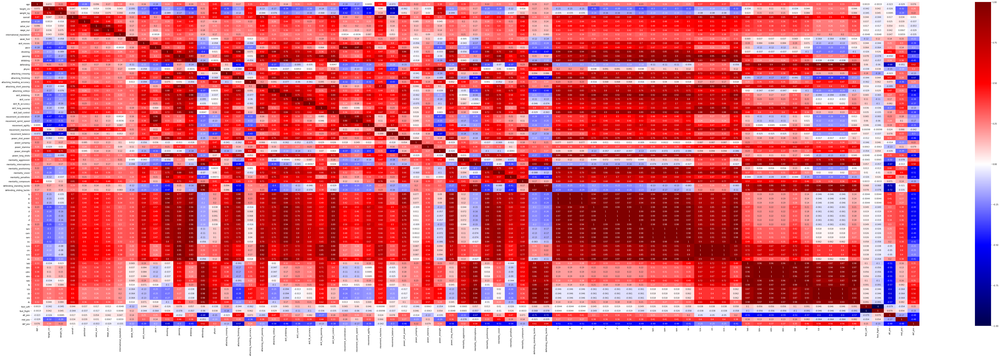

In [19]:
# view correaltion between everything in our dataset after data cleaning, to understand overall relations befor starting our tarin and test models
plt.figure(figsize = (100,30))
sns.heatmap(df.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1);

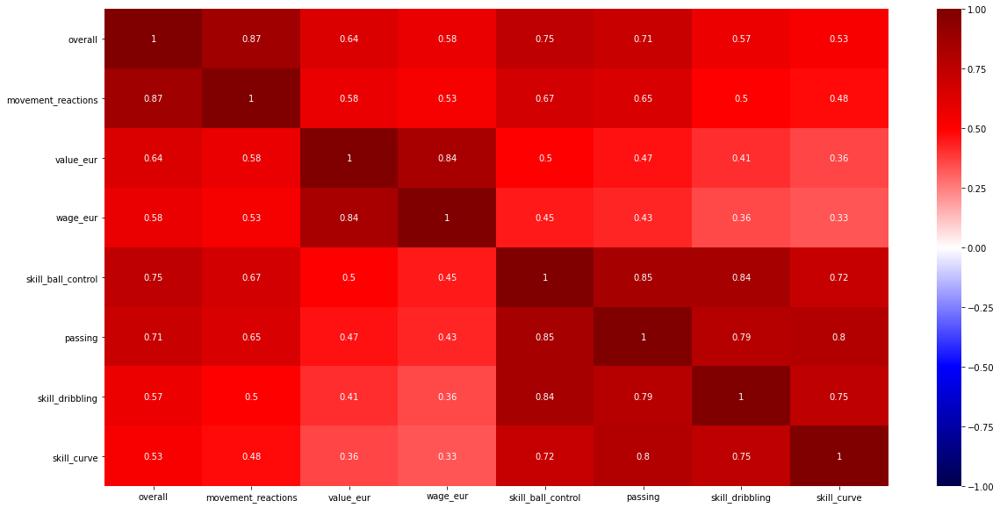

In [29]:
# view correaltion between some of features in our dataset after data cleaning, to understand overall relations befor starting our tarin and test models
plt.figure(figsize = (20,10))
subset=['overall','movement_reactions','value_eur', 'wage_eur', 'skill_ball_control','passing','skill_dribbling',
        'skill_curve']
r=df.loc[:,subset]
sns.heatmap(r.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1);

In [20]:
df.describe()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_standing_tackle,defending_sliding_tackle,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,foot_Left,foot_Right,att_pos,mid_pos,def_pos
count,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,1.665400e+04,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000,16654.000000
mean,25.040471,180.314759,74.191486,65.773568,71.232617,2.322826e+06,9086.856011,1.092771,2.989612,2.530563,67.680978,52.237420,57.092410,62.433770,51.266903,64.427885,53.967395,50.035307,56.514891,62.585805,46.476162,60.733337,51.193947,45.790441,55.884953,63.271887,67.661403,67.676114,66.296145,61.940435,66.591570,59.118830,65.506125,66.607542,65.307193,51.031704,59.109823,49.926204,55.129819,55.658040,51.590549,59.927405,51.713342,49.438633,60.081362,60.081362,60.081362,59.537228,59.221929,59.221929,59.221929,59.537228,61.354810,61.354810,61.354810,62.032605,60.558244,60.558244,60.558244,62.032605,59.664525,58.933529,58.933529,58.933529,59.664525,58.952324,57.504563,57.504563,57.504563,58.952324,0.253513,0.746487,0.278131,0.517834,0.405848
std,4.535539,6.517726,6.712228,6.907671,6.076915,5.167850e+06,20166.874698,0.363275,0.645053,0.634008,10.961646,13.994958,10.285321,10.049982,16.390645,9.739706,13.857254,16.229786,11.668482,9.545791,14.597936,12.141485,14.871179,14.817569,12.358065,9.679512,11.436355,11.220940,12.022930,8.784191,11.969857,13.336721,11.584929,11.258925,12.525414,15.694995,14.226007,18.739589,14.260362,12.649746,12.363266,10.363047,18.822130,18.718961,8.977145,8.977145,8.977145,9.690033,9.698059,9.698059,9.698059,9.690033,9.459558,9.459558,9.459558,8.966880,8.669921,8.669921,8.669921,8.966880,8.986625,10.099575,10.099575,10.099575,8.986625,9.578018,11.579533,11.579533,11.579533,9.578018,0.435035,0.435035,0.448092,0.499697,0.491070
min,16.000000,155.000000,50.000000,47.000000,47.000000,2.000000e+04,500.000000,1.000000,1.000000,1.000000,28.000000,16.000000,25.000000,25.000000,15.000000,28.000000,11.000000,10.000000,14.000000,22.000000,10.000000,14.000000,12.000000,10.000000,19.000000,21.000000,27.000000,25.000000,27.000000,30.000000,26.000000,18.000000,26.000000,23.000000,24.000000,11.000000,15.000000,10.000000,12.000000,13.000000,13.000000,30.000000,10.000000,10.000000,30.000000,30.000000,30.000000,26.000000,28.000000,28.000000,28.000000,26.000000,30.000000,30.000000,30.000000,29.000000,30.000000,30.000000,30.000000,29.000000,26.000000,28.000000,28.000000,28.000000,26.000000,27.000000,27.000000,27.000000,27.000000,27.000000,0.0

In [21]:
# split our data into train and test, to figure out our linear regression moudel base on player value
X_value = df.drop('value_eur', axis=1)
y_value = df['value_eur']
X_value_train, X_value_test, y_value_train, y_value_test = train_test_split(X_value, y_value,
                                                                            test_size=0.2, random_state=42)

# set our liner regression score for perdicting player price base on all of our features, 
#as we can see we got 78% witch is good 
lr = LinearRegression()
lr.fit(X_value_train, y_value_train)
predictions = lr.predict(X_value_test)

#Finding the r2 score and root mean squared error
print('r2 score: '+str(r2_score(y_value_test, predictions)))
print('RMSE : '+str(np.sqrt(mean_squared_error(y_value_test, predictions))))

r2 score: 0.7851041044554063
RMSE : 2619163.5620737183


In [22]:
pd.DataFrame({ 'True Values': y_value_test, 'Predicted Values': predictions}).hvplot.scatter(x='True Values',
                                                                                            y='Predicted Values')

:Scatter   [True Values]   (Predicted Values)

In [23]:
# split our data into train and test, to figure out our linear regression moudel base on overall porformance 
X_overall = df.drop('overall', axis=1)
y_overall = df['overall']
X_overall_train, X_overall_test, y_overall_train, y_overall_test = train_test_split(X_overall, y_overall, test_size=0.2, random_state=42)

# set our liner regression accuracy score for perdicting player overall performance base on all of our features, 
#as we can see we got 94% witch is great 
lr = LinearRegression()
fit2 = lr.fit(X_overall_train, y_overall_train)
predictions2 = lr.predict(X_overall_test)


#Finding the r2 score and root mean squared error
print('r2 score: '+str(r2_score(y_overall_test, predictions2)))
print('RMSE : '+str(np.sqrt(mean_squared_error(y_overall_test, predictions2))))

r2 score: 0.9423670034257592
RMSE : 1.6858125893701004


In [24]:
pd.DataFrame({'True Values': y_overall_test, 'Predicted Values': predictions2}).hvplot.scatter(x='True Values',
                                                                                            y='Predicted Values')

:Scatter   [True Values]   (Predicted Values)